<p style="font-size: 48px;"><strong><big>Supermarket Customer Clustering</big></strong></p>

[Dataset Link](https://www.kaggle.com/datasets/dev0914sharma/customer-clustering?select=segmentation+data.csv)


---
# Background

---
## Business Understanding

A supermarket owner seeks to understand their customers better by analyzing their membership card data. This information, including customer identification, age, gender, annual income, and spending habits, will enable the owner to tailor marketing strategies effectively. Identifying the target customer demographic is crucial for the success of a supermarket. It allows for:
* **Tailored Marketing Strategies**: Creating targeted campaigns that resonate with specific customer segments.
* **Optimized Product Offerings**: Ensuring the supermarket offers products that meet the needs and preferences of its customers.
* **Improved Customer Experience**: Providing a shopping experience that is tailored to customers' preferences.
* **Enhanced Customer Loyalty**: Building stronger relationships with customers and encouraging repeat business.
* **Competitive Advantage**: Differentiating the supermarket and attracting more customers.

By understanding their customers, supermarket owners can develop more effective marketing strategies, optimize their product offerings, improve the customer experience, enhance customer loyalty, and gain a competitive advantage.

---
## Regarding Customer Segmentation

**Customer segmentation** is a marketing strategy that divides a customer base into distinct groups based on shared characteristics. These characteristics can include demographics (age, gender, income, education), psychographics (lifestyle, values, interests), behavior (purchase frequency, spending habits, brand loyalty), or geographic location. By understanding these segments, businesses can tailor their marketing efforts to specific groups of customers, increasing their chances of success.   

One common segmentation method is **demographic segmentation**. This involves dividing customers based on their age, gender, income, education level, or family size. For example, a clothing retailer might target young adults with a focus on trendy and affordable styles. Another approach is **psychographic segmentation**, which categorizes customers based on their lifestyle, values, and interests. This can include segments like "outdoor enthusiasts," "fashion-conscious individuals," or "eco-conscious consumers."

**Behavioral segmentation** focuses on customers' purchasing behavior, such as purchase frequency, spending habits, and brand loyalty. For instance, a grocery store might identify "loyal customers" who consistently shop at their store and offer them exclusive discounts or rewards. **Geographic segmentation** divides customers based on their location, such as country, region, city, or neighborhood. This can be helpful for businesses that cater to local markets or want to expand their reach to specific geographic areas.

By effectively segmenting their customer base, businesses can **develop more targeted marketing campaigns, improve customer satisfaction, and increase sales**. For example, a company that sells luxury goods might focus on targeting high-income individuals with a sophisticated lifestyle. In contrast, a budget-friendly retailer might target price-conscious consumers who are looking for affordable options.

Customer segmentation is a dynamic process that requires ongoing analysis and adjustment. As customer preferences and behaviors change over time, businesses need to reassess their segmentation strategies to ensure they remain relevant and effective.

---
## Dataset Used

The dataset used was taken from [Kaggle](https://www.kaggle.com/datasets/dev0914sharma/customer-clustering?select=segmentation+data.csv). In the data, there are eight columns with the details below:

|<center>Columns</center>|<center>Data Type</center>|<center>Range</center>|<center>Definition</center>|
|:---:|:---:|:---:|---|
|`ID`|numerical|Integer|Shows a unique identificator of a customer.|
|`Sex`|categorical|{0,1}|Biological sex (gender) of a customer. In this dataset, there are only two different options.<br>0 male<br>1 female|
|`Marital status`|categorical|{0,1}|Marital status of a customer.<br>0 single<br>1 non-single(divorced / separated / married / widowed)|
|`Age`|numerical|Integer|The age of the customer in years, calculated as current year minus the year of birth of the customer at the time of creation of the dataset.<br> 18 is the lowest age observed in the dataset<br>76 is the highest age observed in the dataset|
|`Education`|categorical|{0,1,2,3}|Level of education of the customer.<br>0 other / unknown<br>1 high school<br>2 university<br>3 graduate school|
|`Income`|numerical|Real|Self-reported annual income in US dollar of the customer.<br>35,832 is the lowest income observed in the dataset<br>309,364 is the highest income observed in the dataset|
|`Occupation`|categorical|{0,1,2}|Category of occupation of the customer.<br>0 unemployed / unskilled<br>1 skilled employee / official<br>2 management / self-employed / highly qualified employee / officer|
|`Settlement size`|categorical|{0,1,2}|The size of the city that the customer lives in.<br>0 small city<br>1 mid-sized city<br>2 big city|

---
---
# Data Preparation

---
## Importing Dataset

In [1]:
# importing pandas
import numpy as np # type: ignore
import pandas as pd # type: ignore
import matplotlib.pyplot as plt # type: ignore
import seaborn as sns # type: ignore
%matplotlib inline

# Warning
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [2]:
# importing dataset
df = pd.read_csv("segmentation data.csv")
df

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...,...
1995,100001996,1,0,47,1,123525,0,0
1996,100001997,1,1,27,1,117744,1,0
1997,100001998,0,0,31,0,86400,0,0
1998,100001999,1,1,24,1,97968,0,0


---
### Checking Data Types

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


In [4]:
df[['Sex', 'Marital status', 'Education', 'Occupation', 'Settlement size']] = df[['Sex', 'Marital status', 'Education', 'Occupation', 'Settlement size']].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   ID               2000 non-null   int64   
 1   Sex              2000 non-null   category
 2   Marital status   2000 non-null   category
 3   Age              2000 non-null   int64   
 4   Education        2000 non-null   category
 5   Income           2000 non-null   int64   
 6   Occupation       2000 non-null   category
 7   Settlement size  2000 non-null   category
dtypes: category(5), int64(3)
memory usage: 57.5 KB


---
## Extrapolatory Data Analysis Pre-Cleaning

---
### Analysis with Pandas Profiling

In [5]:
# importing pandas profiling
from ydata_profiling import ProfileReport # type: ignore

# set report
report_pre = ProfileReport(df)
report_pre

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# saving Analysis pre-cleaning
report_pre.to_file('default_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

The profile report can be viewed in [default_report.html](default_report.html).

From pandas profiling, there are several key foundings listed below:
* There are more male customers than female customers registered, even with few differences.
* Likewise, the proportion of single customers with customers that ever married is almost 50:50.
* In age data, the median is 33 years old while the mean is 35-36 years old. However, the age distribution is skewed to the right with the minimum of 18 years old and the oldest customers are 76 years old. Most of the customers is 26-ish years old from the histogram.
* Most of the customers are high-school graduates, with almost 70% of them are high-school graduates. Also, roughly 2% of the customers have graduates degree.
* Regarding income, the distribution is also right skewed. The minimal annual income recorded was $35,832, with the median of $115,548.50 and mean of $120,954.42. In addition, there are extreme value since the 95th percentile is $190,871.20 while the maximum annual income recorded is $309,364.
* Most of the customers are skilled officials or employees, with over 55% of customers are coded 1 in the `Occupation` data. However, only around 12% of the customers are in management / self-employed.
* In settlement size, nearly 50% of customers live in small-sized city, while the rest live in either mid-sized city or big city.

Since there is no missing values, it can be progressed to the next step.

---
## Extrapolatory Data Analysis with Cleaned Data

In [7]:
df.columns

Index(['ID', 'Sex', 'Marital status', 'Age', 'Education', 'Income',
       'Occupation', 'Settlement size'],
      dtype='object')

In [ ]:
# preparing lists based on columns to be used in visualizations

numeric = ['Age', 'Income']
categorical = ['Sex', 'Marital status', 'Education', 'Occupation', 'Settlement size']

---
### Bivariate Analysis

#### Bivariate Analysis between Numerical Columns with Numerical Columns

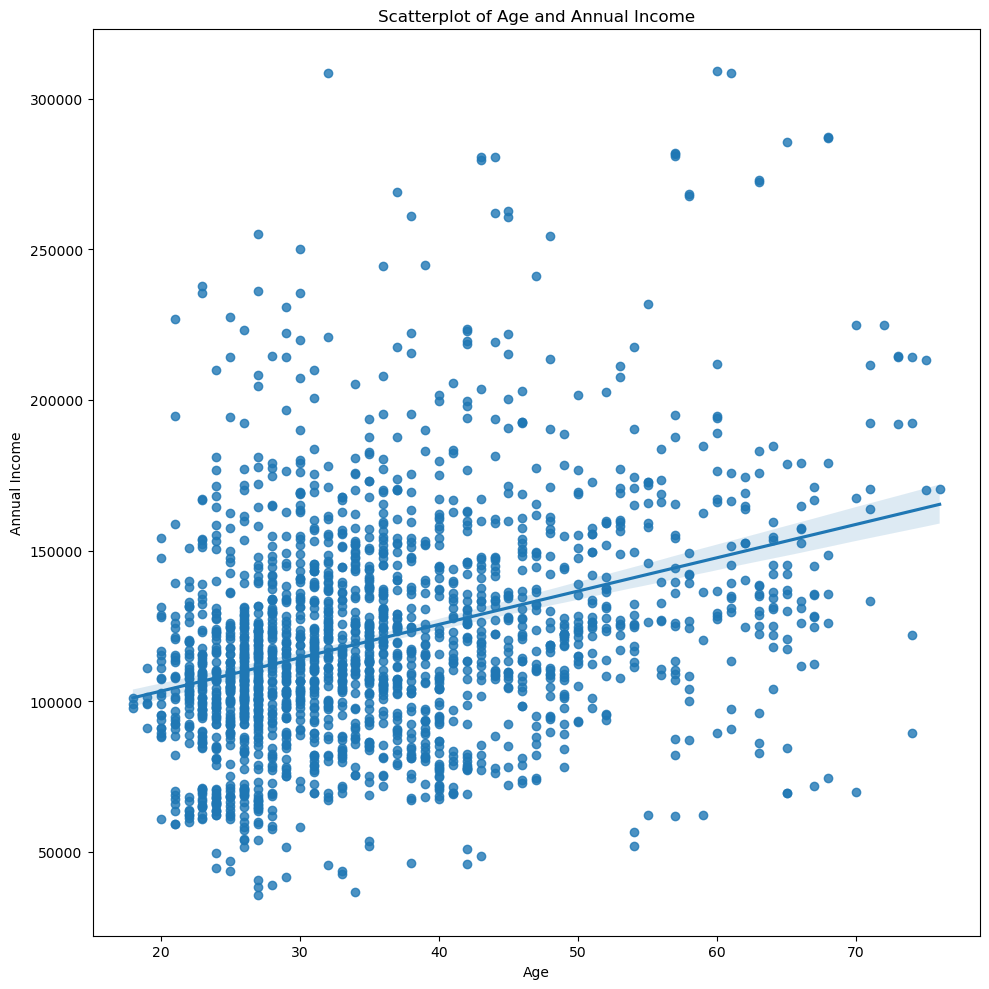

In [ ]:
# Scatterplot of Age and Annual Income

plt.figure(figsize=(10,10))
sns.regplot(data=df, x='Age', y='Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.title('Scatterplot of Age and Annual Income')
plt.tight_layout()
plt.show()

From the scatterplot, it can be seen that there is a weak trend of the older the customers, the bigger their annual incomes. However, it should be noted that this trend is weak, with many residuals outside the regression trend.

#### Bivariate Analysis between Categorical Columns with Categorical Columns

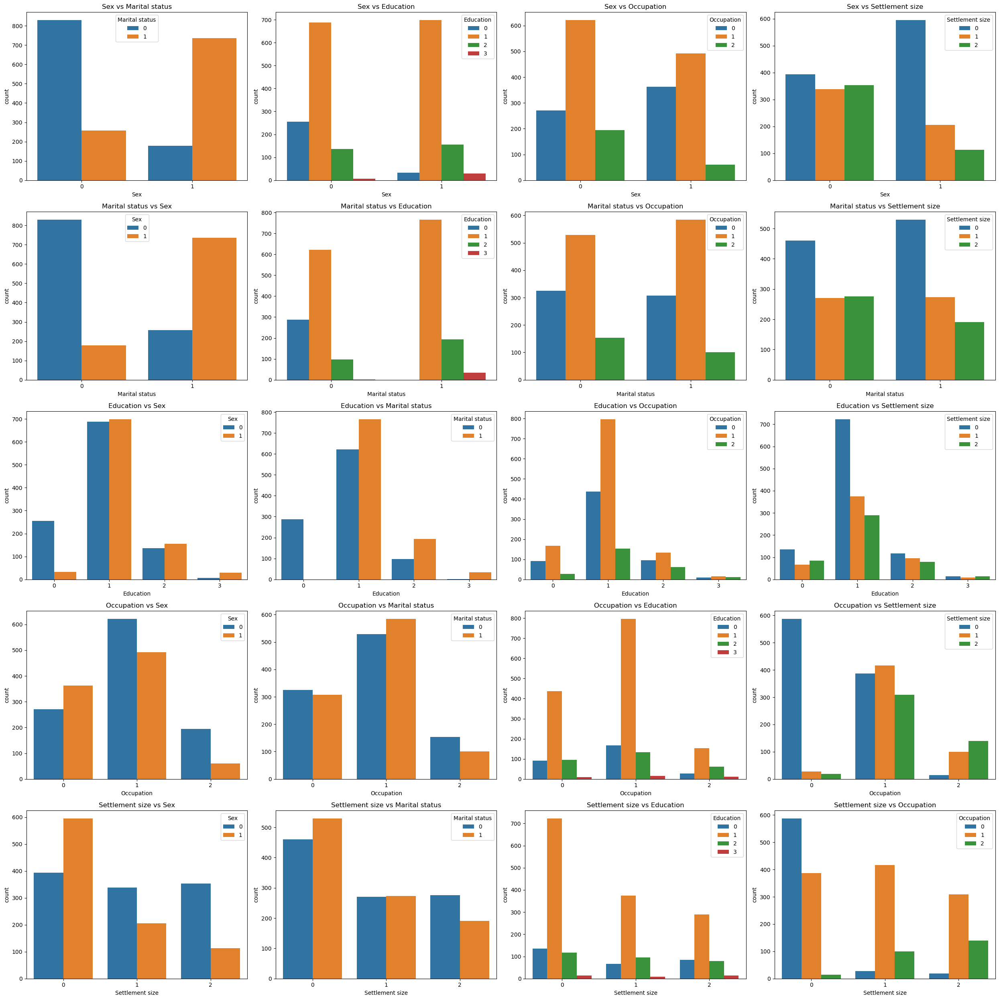

In [ ]:
# Making bar charts between categorical columns

fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(25,25))
axes = axes.flatten()
ax = 0

for cat1 in categorical: #THe base chart
    for cat2 in categorical: # Hue
        if cat1!=cat2:
            sns.countplot(data=df, x=cat1, hue=cat2, ax=axes[ax])
            axes[ax].set_title(f'{cat1} vs {cat2}')
            ax += 1
plt.tight_layout()
plt.show()

There are some key findings that are found based on this visualization:
* Regarding sex:
    * Most male customers are single, while most female customers are ever married before (separated / married / divorce / widow).
    * While male customers' settlement sizes were spread evenly between small, mid-sized, and big city, female customers' settlement size tend to be in small city.
* Regarding marital status:
    * Ever married customers have clear education level.
* Regarding education:
    * Most customers with unknown education level are single.
    * Higher education might have trend of having level of jobs.
* Regarding occupation:
    * Most unemployed / unskilled customers are female.
    * The higher a customer's occupation level, the more chance of them to be in big city compared to lower occupation level. Similarly, unskilled workers or unemployed customers tend to be in small city.
* Regarding settlement size:
    * In small city, more customers are married, while in big city, more customers are single.

#### Bivariate Analysis between Numerical Columns with Categorical Columns

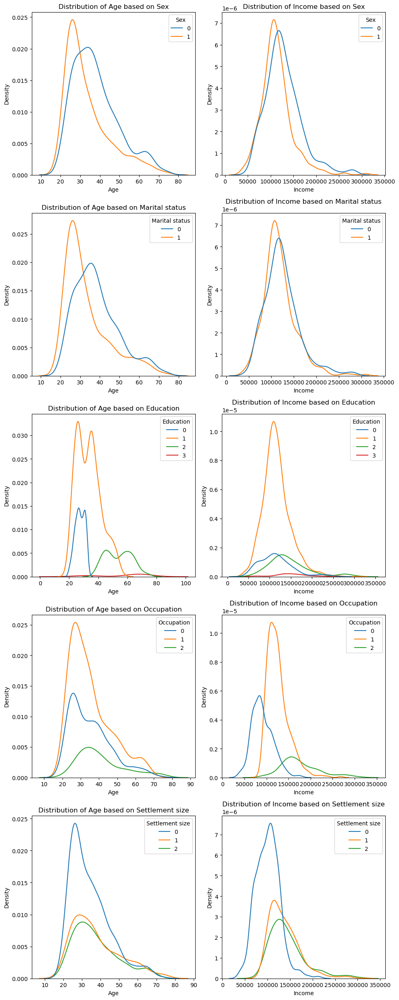

In [ ]:
# Comparing distributions

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,25))
axes = axes.flatten()
ax = 0

for cat in categorical:
    for num in numeric:
        sns.kdeplot(data=df, x=num, hue=cat, ax=axes[ax])
        axes[ax].set_title(f'Distribution of {num} based on {cat}')
        ax+=1
plt.tight_layout()
plt.show()


There are some key findings that can be found from this visualization:
* Male customers tend to be older than female customers based on the age distribution, however their income distributions are similar.
* Ever-married customers also tend to be older than female customers based on the age distribution, with their income distributions be similar.
* Other than those whose education level is unknown, customers who are in higher education levels tend to be older with higher annual income based on the distributions.
* Similar with education level, occupation also has similar trends where customers with higher occupation levels tend to be older and richer.
* Based on settlement size, the age distributions among the three class are similar, but customers live in bigger city tent to be richer than those in small city.


---
### Multivariate Analysis

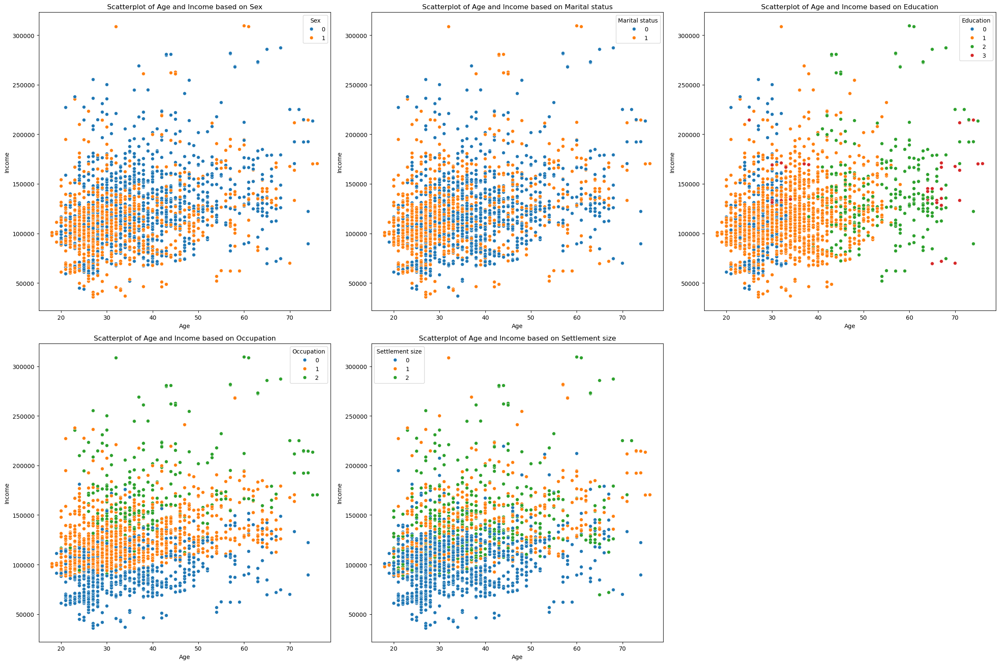

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,16))
axes = axes.flatten()
ax = 0

for cat in categorical:
    sns.scatterplot(data=df, x='Age', y='Income', hue=cat, ax=axes[ax])
    axes[ax].set_title(f'Scatterplot of Age and Income based on {cat}')
    ax+=1
if len(categorical) < len(axes):
    for j in range(len(categorical), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

---
---
# Unsupervised Machine Learning

---
## Feature Engineering

Since all columns already encoded, the feature engineering to be done will be scaling using robust scaler on `Age` and `Income`.

In [ ]:
# Copying dataframe
X = df.drop(columns='ID').copy()
X.head(5)

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1


In [14]:
# Perform scaling

from sklearn.preprocessing import RobustScaler # type: ignore

scaler = RobustScaler()
X_cluster = scaler.fit_transform(X)

X_cluster

array([[ 0.        ,  0.        ,  2.26666667, ...,  0.22572942,
         0.        ,  1.        ],
       [ 1.        ,  1.        , -0.73333333, ...,  0.87169937,
         0.        ,  1.        ],
       [ 0.        ,  0.        ,  1.06666667, ..., -0.65179787,
        -1.        , -1.        ],
       ...,
       [ 0.        ,  0.        , -0.13333333, ..., -0.72133683,
        -1.        , -1.        ],
       [ 1.        ,  1.        , -0.6       , ..., -0.43506397,
        -1.        , -1.        ],
       [ 0.        ,  0.        , -0.53333333, ..., -1.1663862 ,
        -1.        , -1.        ]])

---
## Clustering

In [15]:
# import relevant libraries

from sklearn.cluster import KMeans # type: ignore
from sklearn.metrics import silhouette_score # type: ignore

---
### Determining the Optimal Number of Cluster based on Data

#### Using Elbow Method

In [16]:
# clustering variation

number_of_cluster = range(2,31)
inertia = []

for k in number_of_cluster:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X_cluster)
    inertia.append(kmeans.inertia_)

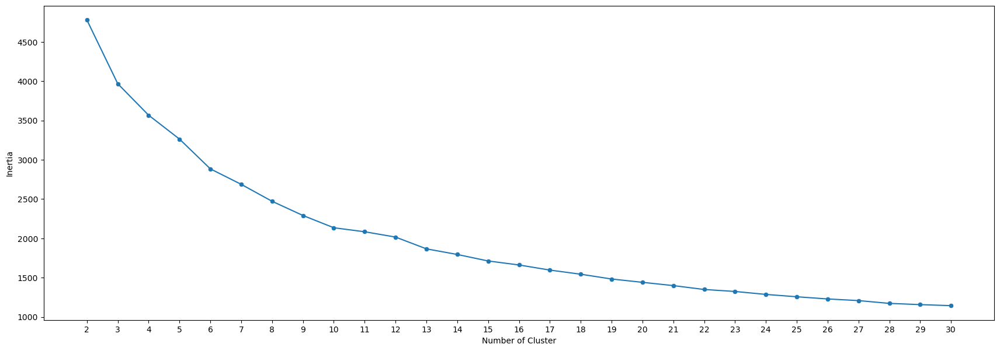

In [17]:
# visualizing elbow scores

plt.figure(figsize=(21,7))
sns.lineplot(x=number_of_cluster, y = inertia)
sns.scatterplot(x=number_of_cluster, y = inertia)
plt.xticks(number_of_cluster)
plt.xlabel('Number of Cluster')
plt.ylabel('Inertia')
plt.show()

#### Using Silhouette Score

In [18]:
# clustering variatiation
silhouette_scores = []

for k in number_of_cluster:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_cluster)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X_cluster, labels, metric= 'euclidean'))

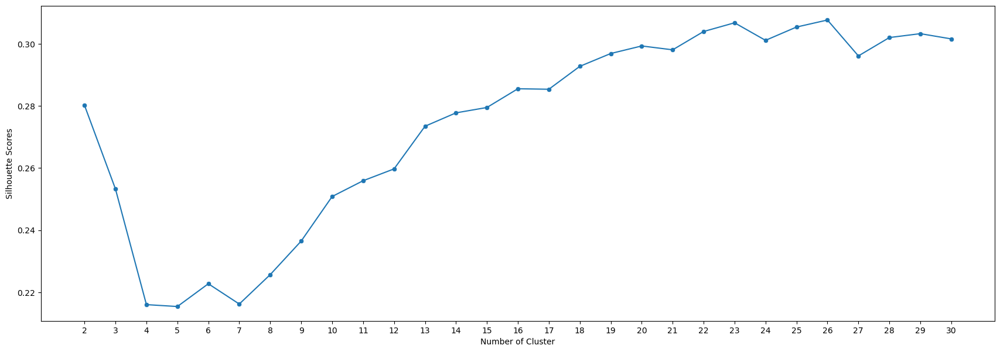

In [19]:
# visualizing silhouette scores

plt.figure(figsize=(21,7))
sns.lineplot(x=number_of_cluster, y = silhouette_scores)
sns.scatterplot(x=number_of_cluster, y = silhouette_scores)
plt.xticks(number_of_cluster)
plt.xlabel('Number of Cluster')
plt.ylabel('Silhouette Scores')
plt.show()

Based on elbow method, and the convenience of clustering, the number of cluster chosen is six. From the silhouette score, the number of 6 also peaks briefly before went down when the cluster number is 7 and then beaten by 8 cluster.

---
### Clustering Using KMeans

#### Clustering Process

In [20]:
kmeans = KMeans(n_clusters=6, random_state=47)
kmeans.fit(X_cluster)

KMeans(n_clusters=6, random_state=47)

In [21]:
# assigning cluster label to dataframe

df_cluster = df.copy()
df_cluster['Label'] = kmeans.labels_

In [22]:
df_cluster['Label'].sort_values().unique()

array([0, 1, 2, 3, 4, 5])

#### Using PCA to visualize clusters

In [23]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(X_cluster)
X_pca = pca.transform(X_cluster)

In [24]:
variance = []
for i in range(0,2):
 variance.append(np.var(X_pca[:,i]))

In [25]:
print('information extracted {} %'.format(np.sum(variance[:2])*100/np.sum(variance)))

information extracted 100.0 %


In [26]:
print("Original shape: {}".format(str(X_cluster.shape)))
print("Reduced shape: {}".format(str(X_pca.shape)))

Original shape: (2000, 7)
Reduced shape: (2000, 2)


Text(0, 0.5, 'Second Component')

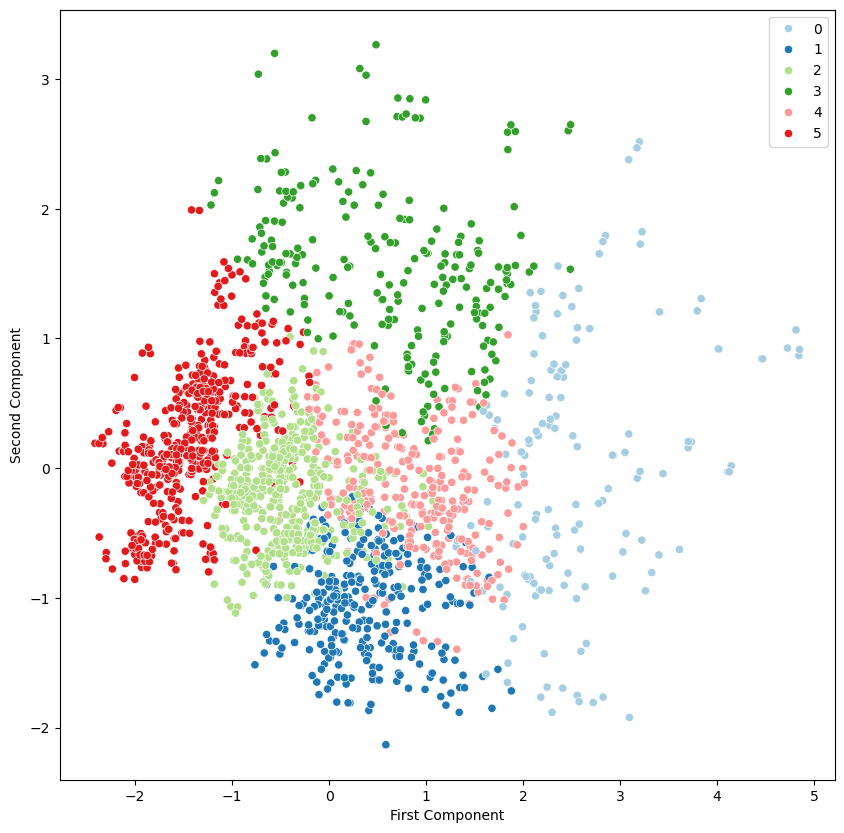

In [27]:
plt.figure(figsize = (10,10))
sns.scatterplot(
    x=X_pca[:,0],
    y=X_pca[:,1],
    hue = kmeans.labels_,
    palette="Paired")

plt.xlabel('First Component')
plt.ylabel('Second Component')

---
---
# Analyzing each clusters

In [28]:
numeric = ['Age', 'Income']
categorical = ['Sex', 'Marital status', 'Education', 'Occupation', 'Settlement size']

---
## Cluster 0

In [29]:
cluster_0 = ProfileReport(df_cluster[df_cluster['Label'] == 0])
cluster_0

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [30]:
cluster_0.to_file('cluster_0_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

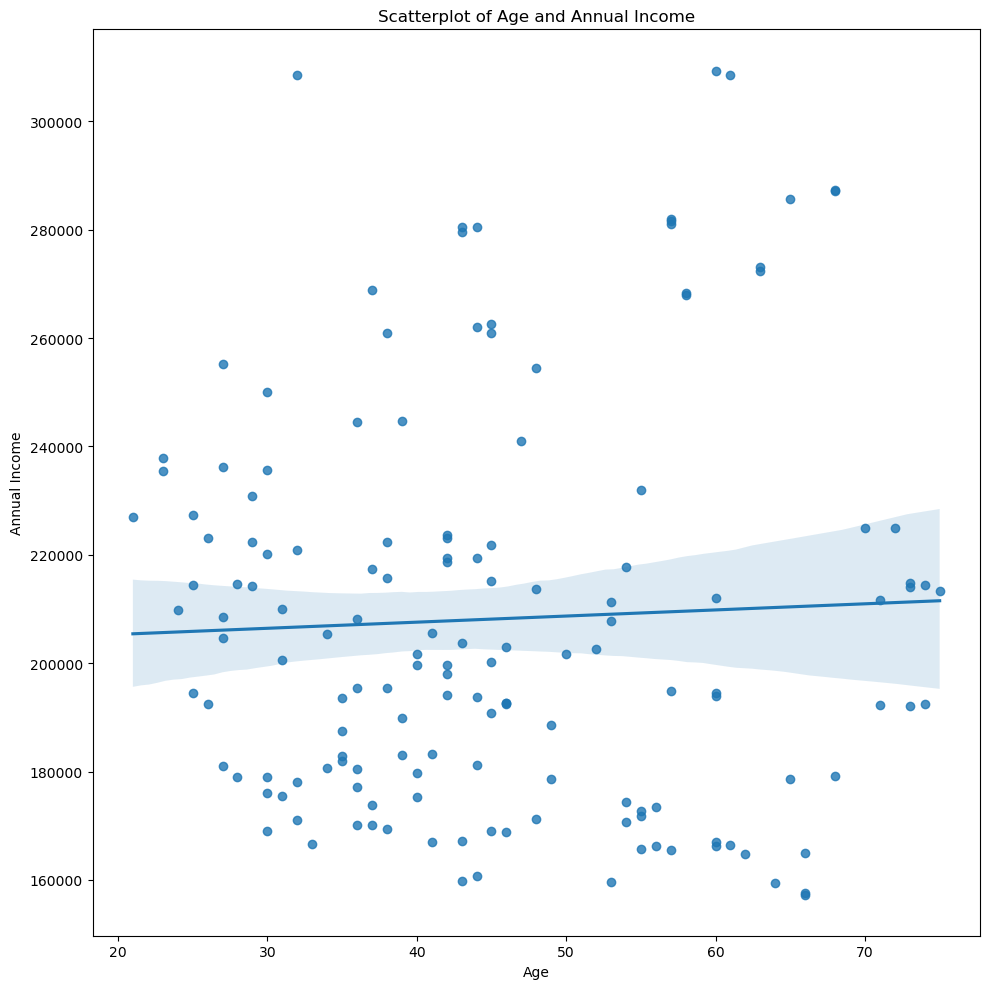

In [31]:
plt.figure(figsize=(10,10))
sns.regplot(data=df_cluster[df_cluster['Label'] == 0], x='Age', y='Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.title('Scatterplot of Age and Annual Income')
plt.tight_layout()
plt.show()

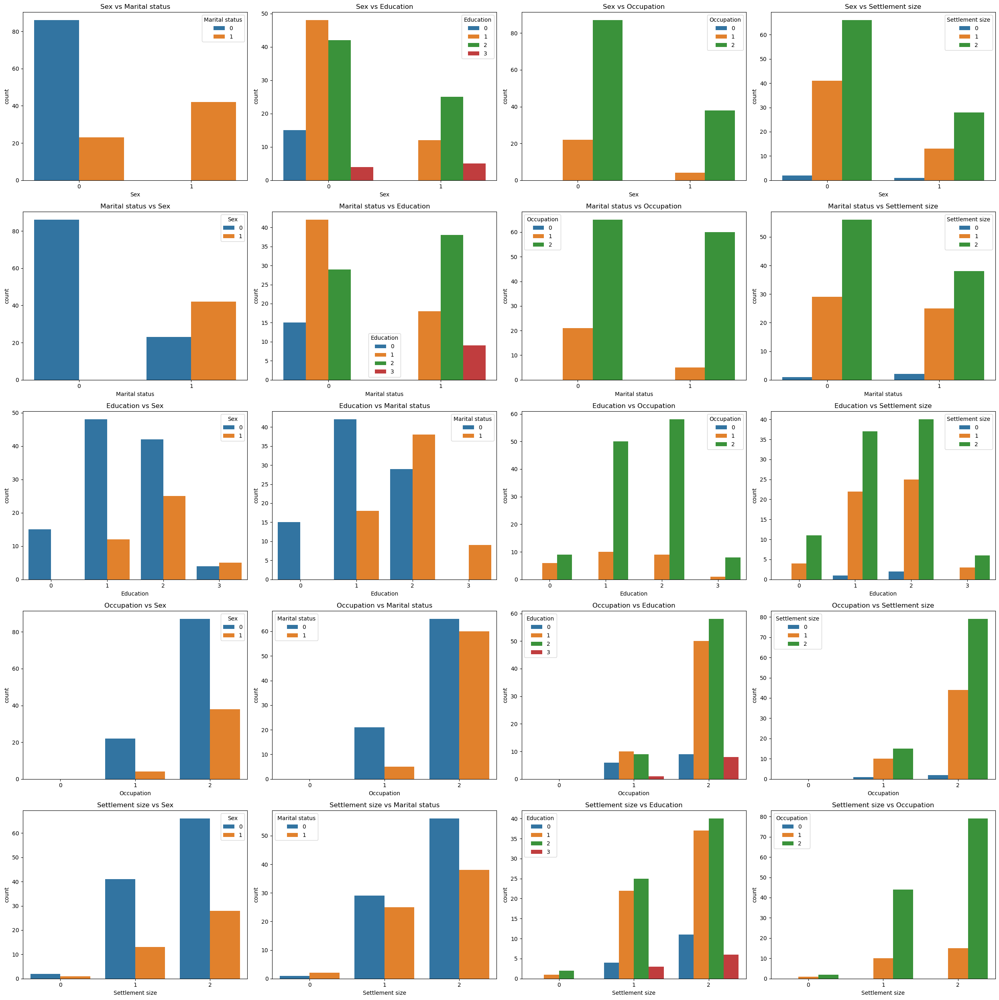

In [32]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(25,25))
axes = axes.flatten()
ax = 0

for cat1 in categorical:
    for cat2 in categorical:
        if cat1!=cat2:
            sns.countplot(data=df_cluster[df_cluster['Label']==0], x=cat1, hue=cat2, ax=axes[ax])
            axes[ax].set_title(f'{cat1} vs {cat2}')
            ax += 1
plt.tight_layout()
plt.show()

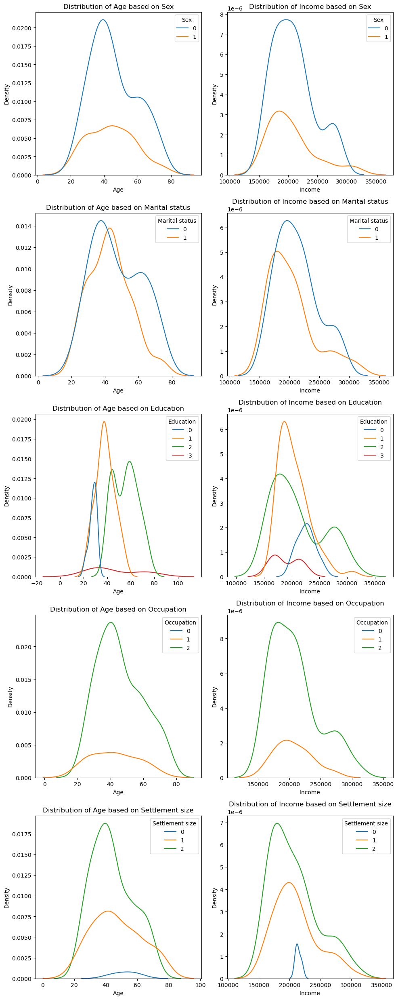

In [33]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,25))
axes = axes.flatten()
ax = 0

for cat in categorical:
    for num in numeric:
        sns.kdeplot(data=df_cluster[df_cluster['Label']==0], x=num, hue=cat, ax=axes[ax])
        axes[ax].set_title(f'Distribution of {num} based on {cat}')
        ax+=1
plt.tight_layout()
plt.show()

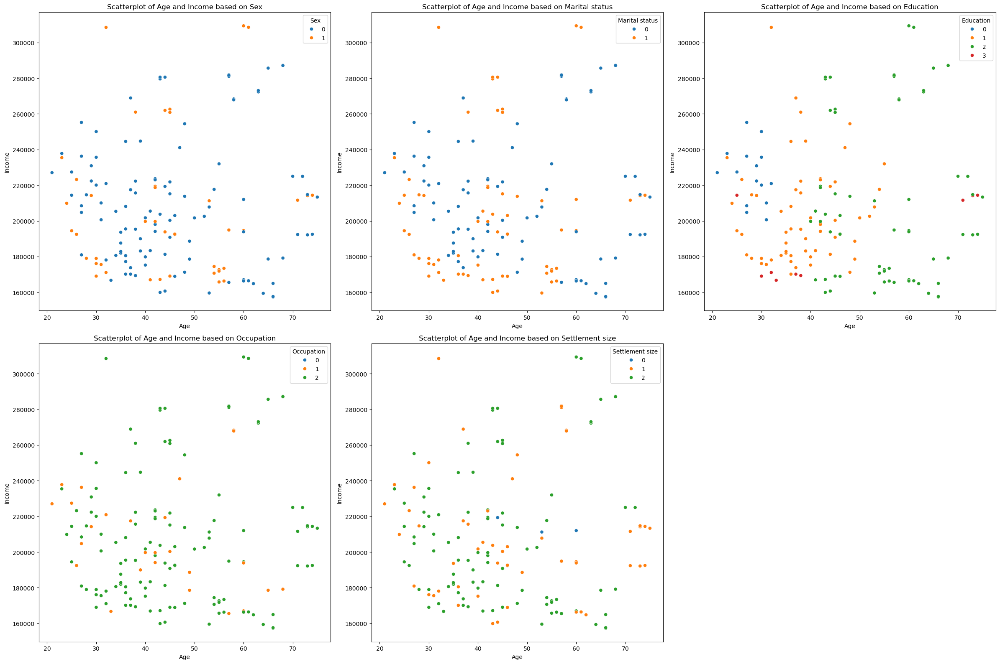

In [34]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,16))
axes = axes.flatten()
ax = 0

for cat in categorical:
    sns.scatterplot(data=df_cluster[df_cluster["Label"]==0], x='Age', y='Income', hue=cat, ax=axes[ax])
    axes[ax].set_title(f'Scatterplot of Age and Income based on {cat}')
    ax+=1
if len(categorical) < len(axes):
    for j in range(len(categorical), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

There are several key findings regarding 'Cluster 0':
* Most in Cluster 0 are males, with the ratio of approximately 72% : 28%. In addition, all female customers in Cluster 0 are married.
* About 57% of customers in Cluster 0 are single.
* Most in Cluster 0 are in their 30s to 40s, with the distribution is centered to these groups.
* Almost 85% of customers in Cluster 0 have university level education (approximately 45%) or high school level education (just below 40%). There are two interesting facts regarding this: those whose education level are in graduate school are not single or ever married before; and from the histogram, the graduate school graduates make less annual income from some of those in other education level groups.
* The distribution of annual income in Cluster 0 is left-skewed, with mean of US$ 208,164 and median of US$ 201,656. However, from the histogram, it's should be noted that the there are two mainly groups of: those whose annual income are between US$ 160,000 and US$ 180,000; and those whose annual income are between US$ 190,000 and US$ 225,000.
* Over 80% if Cluster 0 have high managerial position or own their own business, while the rest are either skilled employees or skilled officials.
* More than 60% of Cluster 0 also live in big city, with only 2% live in small city.

From these findings, these actionable insights were suggested:
* **Use targeted promotions for high-income males or males in managerial positions**, with premium products that suppport their lifestyles.
* **If the customers are married, consider upselling using multi-pack deals or family-sized packaging** for less-premium products.
* **Focus the campaign message to be resonate for customers in 30s to 40s if the customers are males**.

---
## Cluster 1

In [35]:
cluster_1 = ProfileReport(df_cluster[df_cluster['Label'] == 1])
cluster_1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [36]:
cluster_1.to_file('cluster_1_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

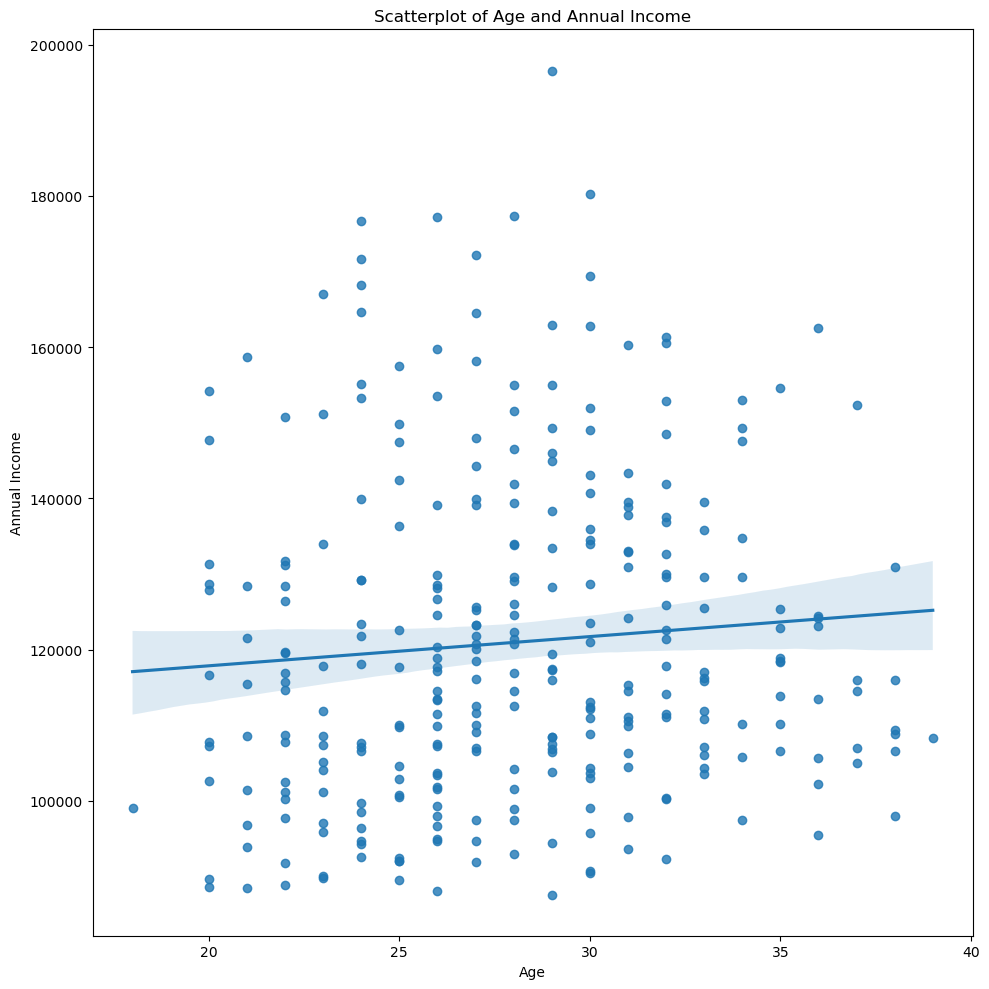

In [37]:
plt.figure(figsize=(10,10))
sns.regplot(data=df_cluster[df_cluster['Label'] == 1], x='Age', y='Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.title('Scatterplot of Age and Annual Income')
plt.tight_layout()
plt.show()

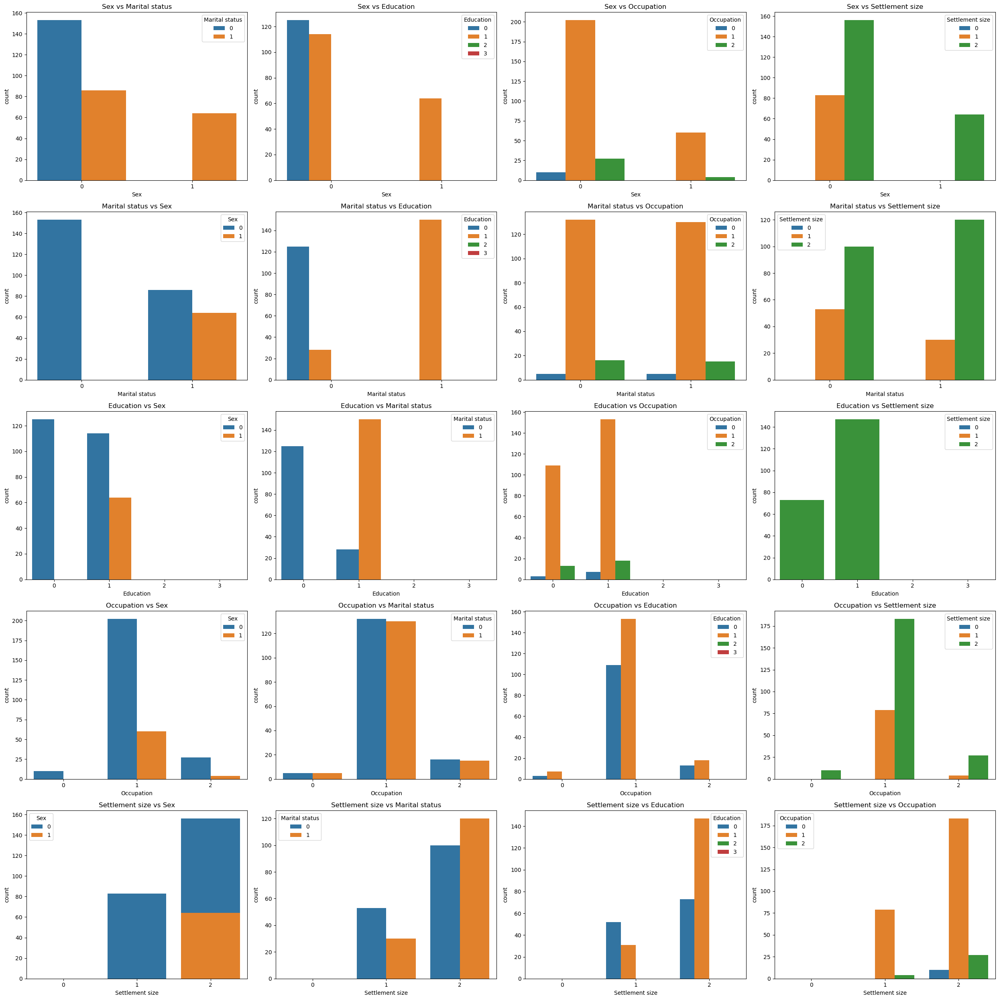

In [38]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(25,25))
axes = axes.flatten()
ax = 0

for cat1 in categorical:
    for cat2 in categorical:
        if cat1!=cat2:
            sns.countplot(data=df_cluster[df_cluster['Label']==1], x=cat1, hue=cat2, ax=axes[ax])
            axes[ax].set_title(f'{cat1} vs {cat2}')
            ax += 1
plt.tight_layout()
plt.show()

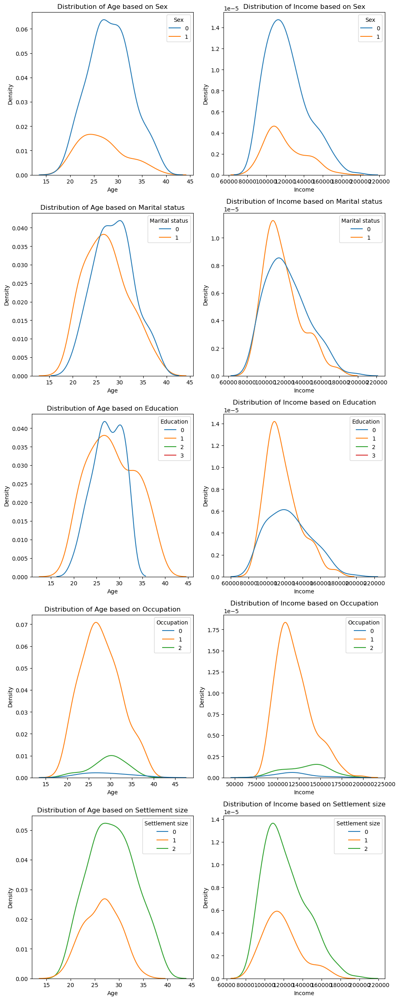

In [39]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,25))
axes = axes.flatten()
ax = 0

for cat in categorical:
    for num in numeric:
        sns.kdeplot(data=df_cluster[df_cluster['Label']==1], x=num, hue=cat, ax=axes[ax])
        axes[ax].set_title(f'Distribution of {num} based on {cat}')
        ax+=1
plt.tight_layout()
plt.show()

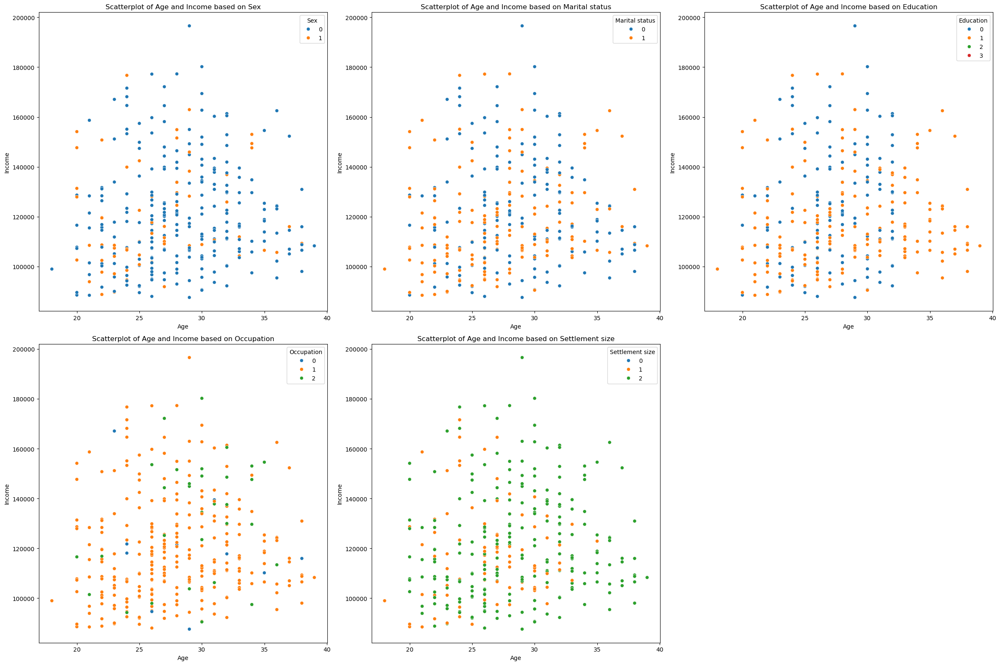

In [40]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,16))
axes = axes.flatten()
ax = 0

for cat in categorical:
    sns.scatterplot(data=df_cluster[df_cluster["Label"]==1], x='Age', y='Income', hue=cat, ax=axes[ax])
    axes[ax].set_title(f'Scatterplot of Age and Income based on {cat}')
    ax+=1
if len(categorical) < len(axes):
    for j in range(len(categorical), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

For customers in Cluster 1, there are several key findings that can be found:
* Almost 80% of customers are male, with only about 20% are female. Furthermore, those male customers are mostly never married before and their education level is categorized as others or unknown, while approximately of 40% of female customers in cluster 1 are high school graduates (and the rests' education level is unknown).
* Same with Cluster 0, all female customers in this cluster are ever married before.
* This cluster is young, with median and mean of 28 years old and Q3 is 31 years old. Those who married before tends to be younger than their single counterparts based on the histogram.
* The distribution of annual income data in this cluster is left-skewed, with the median of US$ 116,848 and mean of US$ 120,939.
* Over 85% customers in this cluster work as skilled employees or officials.
* Almost all customers in this cluster live in big city, with only below 30% live in mid-sized city.

From these findings, actionable insights that can be taken for those in Cluster 2 are:
* **Offer youth-oriented and budget-friendly campaigns and promotions**, using products such as snacks, quick meals, and other cheap products that emphasizes affordability.
* **Advertise products in home essentials and city lifestyle category** that are affordable, good quality, and convenience. These can include fast-moving consumer goods such as quick-cooking ingredients or home-essentials.

---
## Cluster 2

In [41]:
cluster_2 = ProfileReport(df_cluster[df_cluster['Label'] == 2])
cluster_2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [42]:
cluster_2.to_file('cluster_2_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

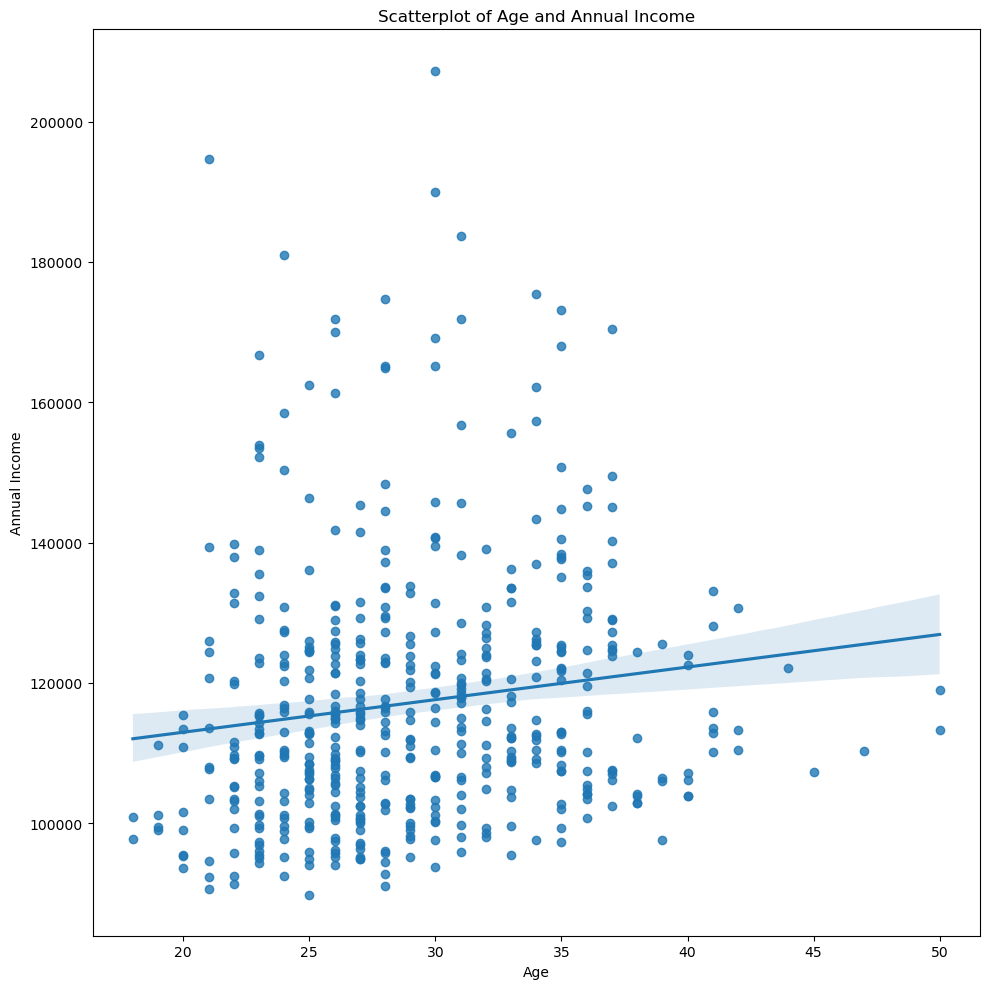

In [43]:
plt.figure(figsize=(10,10))
sns.regplot(data=df_cluster[df_cluster['Label'] == 2], x='Age', y='Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.title('Scatterplot of Age and Annual Income')
plt.tight_layout()
plt.show()

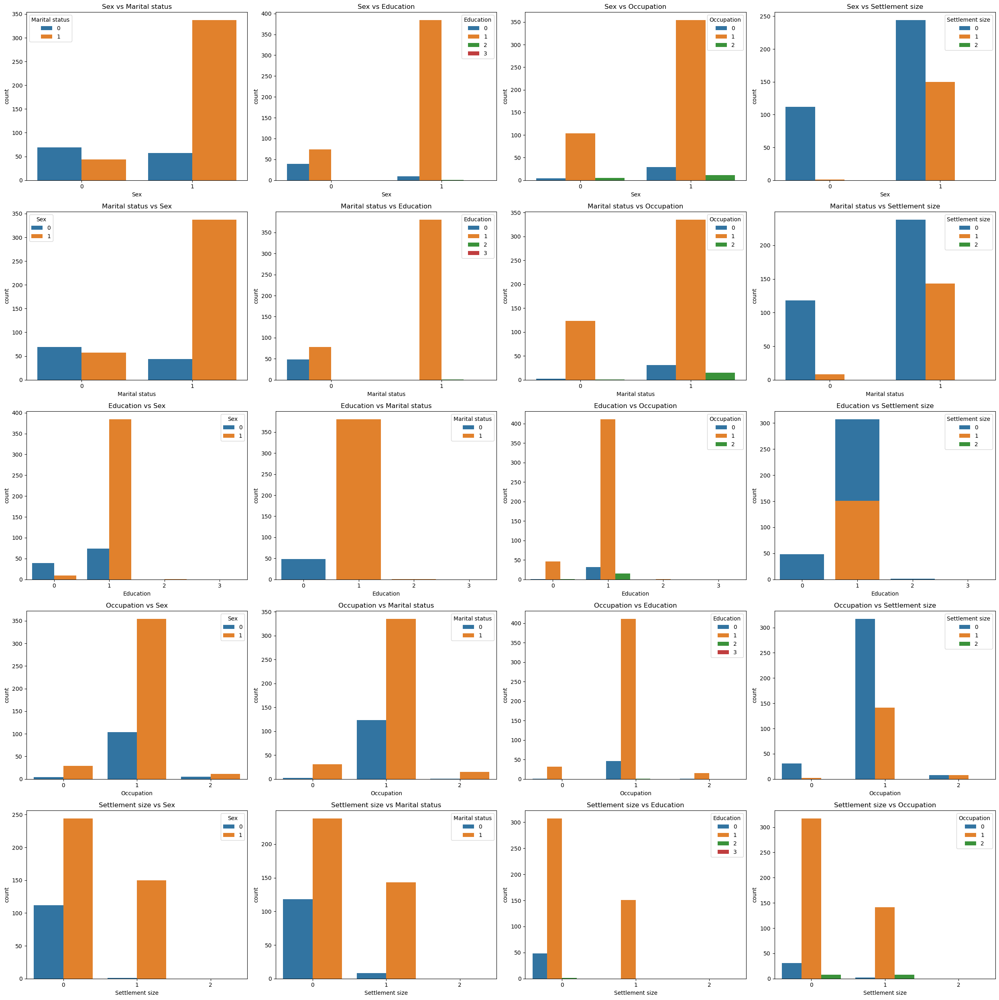

In [44]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(25,25))
axes = axes.flatten()
ax = 0

for cat1 in categorical:
    for cat2 in categorical:
        if cat1!=cat2:
            sns.countplot(data=df_cluster[df_cluster['Label']==2], x=cat1, hue=cat2, ax=axes[ax])
            axes[ax].set_title(f'{cat1} vs {cat2}')
            ax += 1
plt.tight_layout()
plt.show()

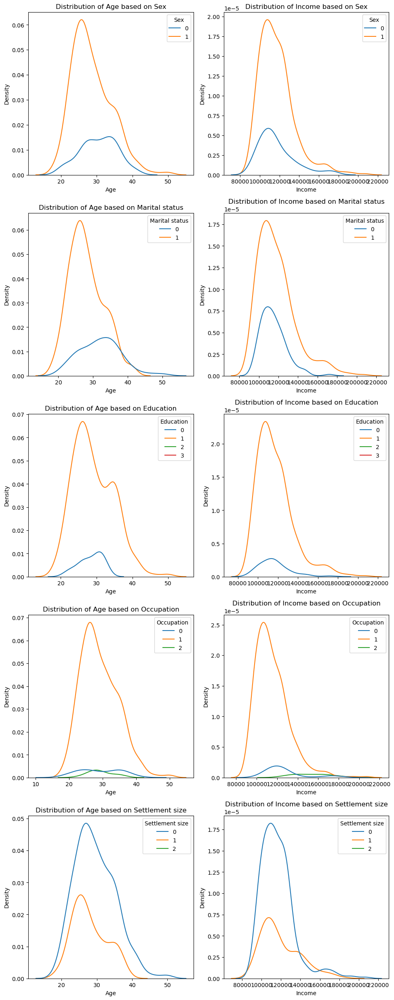

In [45]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,25))
axes = axes.flatten()
ax = 0

for cat in categorical:
    for num in numeric:
        sns.kdeplot(data=df_cluster[df_cluster['Label']==2], x=num, hue=cat, ax=axes[ax])
        axes[ax].set_title(f'Distribution of {num} based on {cat}')
        ax+=1
plt.tight_layout()
plt.show()

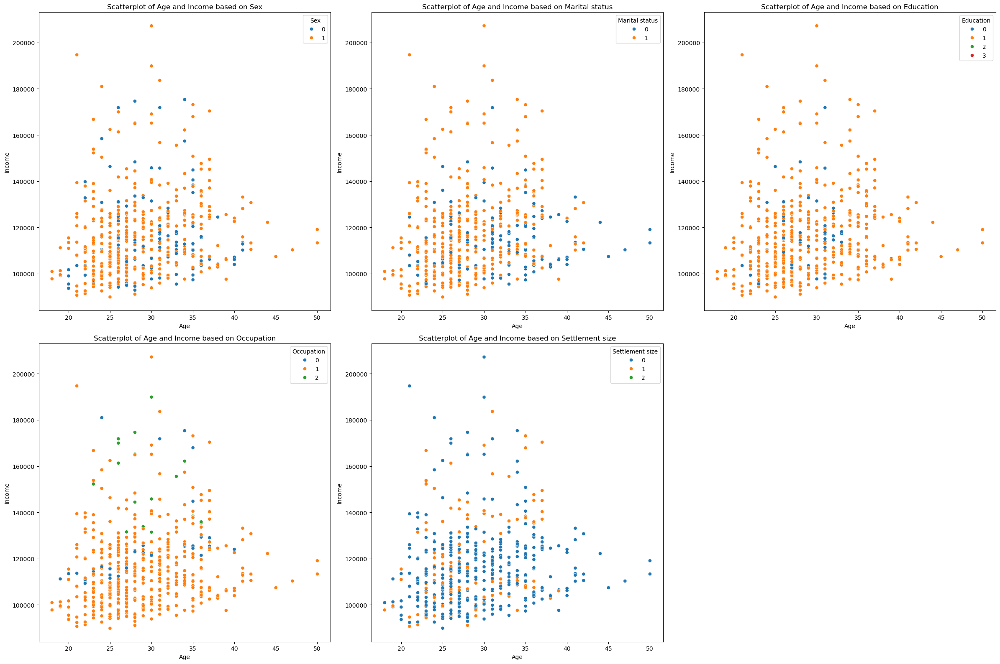

In [46]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,16))
axes = axes.flatten()
ax = 0

for cat in categorical:
    sns.scatterplot(data=df_cluster[df_cluster["Label"]==2], x='Age', y='Income', hue=cat, ax=axes[ax])
    axes[ax].set_title(f'Scatterplot of Age and Income based on {cat}')
    ax+=1
if len(categorical) < len(axes):
    for j in range(len(categorical), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

In Cluster 2, these key findings can be found:
* Over 75% customers in this cluster are female, with most of the female customers are ever married before. Those female customers are also high school graduates.
* Approximately two-thirds of the customers are ever married before.
* Same with Cluster 1, the customers in this cluster tend to be young, with median of 28 years old and mean of 29 years old. The Q3 and 95-th percentile are 33 years old and 38 years old respectively. Male customers tend to be older based on the histogram. Single customers also tend to be older.
* Over 90% of these customers are high school graduates, with only one customer in this cluster graduated from university. The rest of them have unknown level of education and single at the same time.
* Same with Cluster 1, these customers also have lower annual income, with the median of US$ 113,212 and mean of US$ 177,194.
* They also mostly work as skilled employee or officials.
* What differentiate them from Cluster 1 is the settlement size, more than 70% of them live in small city. All male customers in this cluster live in small city, while only 1/3 of female customers lives in mid-sized city.

Thus, doing these things is recommended:
* **Promote family-oriented products**, especially with female customers. This can include household essentials and products with budget-friendly bulk options.
* **Emphasize accessibility and affordability** for customers that live in small city.
* For male customers, **focusing on promoting a simple, small city lifestyle** can be encouraged, with promotions on essentials and practical products that help in solo living.

---
## Cluster 3

In [47]:
cluster_3 = ProfileReport(df_cluster[df_cluster['Label'] == 3])
cluster_3

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [48]:
cluster_3.to_file('cluster_3_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

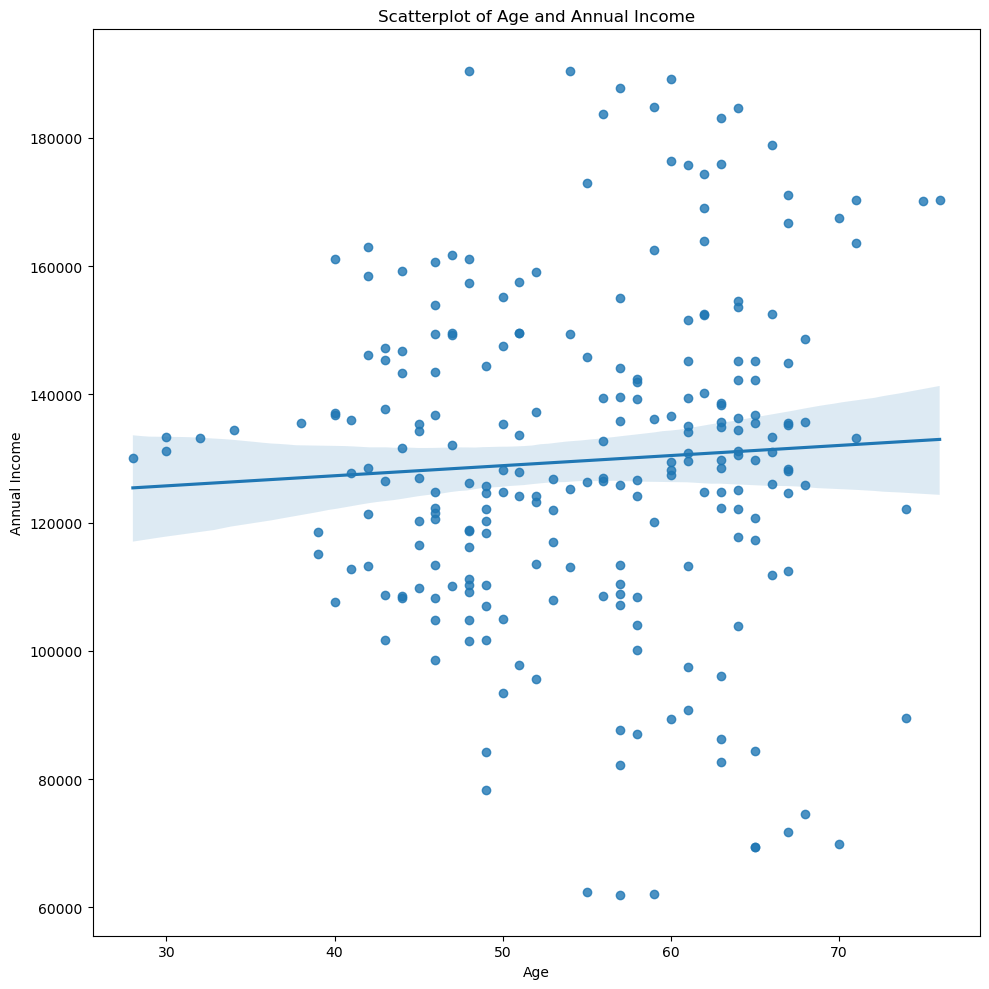

In [49]:
plt.figure(figsize=(10,10))
sns.regplot(data=df_cluster[df_cluster['Label'] == 3], x='Age', y='Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.title('Scatterplot of Age and Annual Income')
plt.tight_layout()
plt.show()

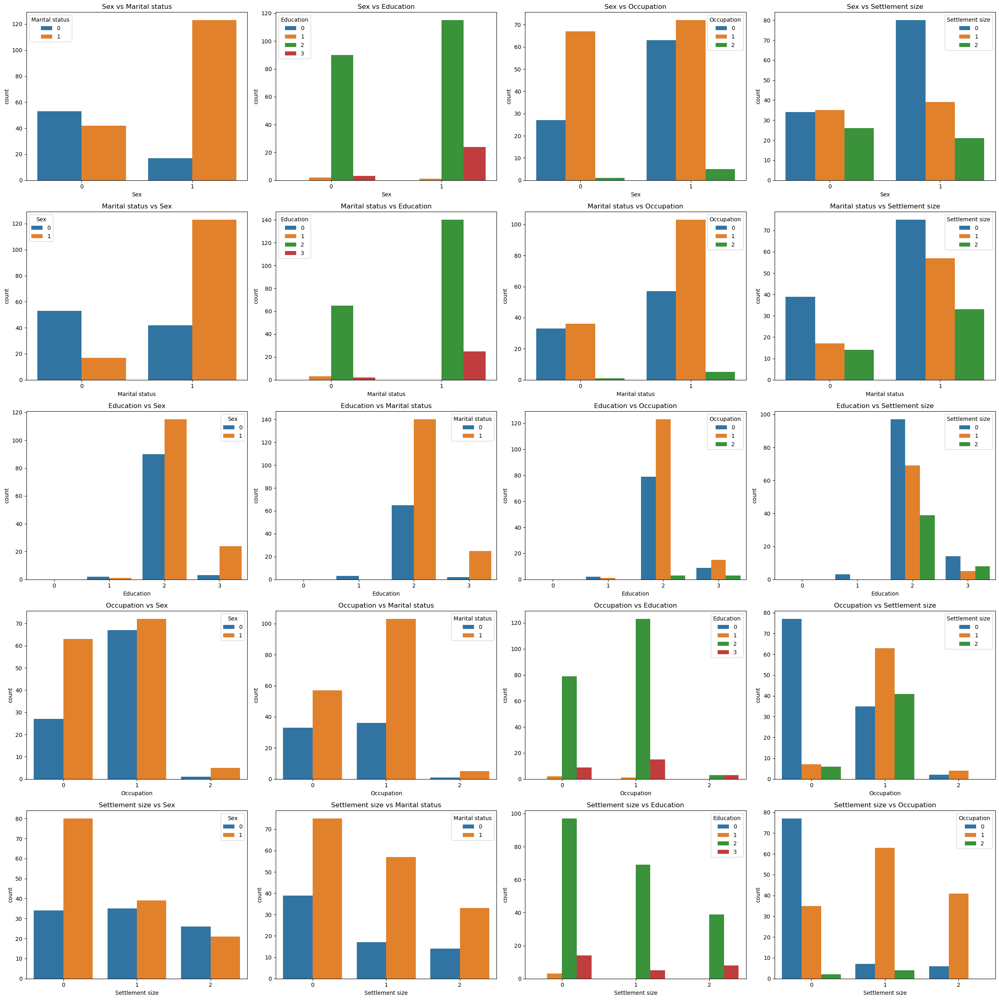

In [50]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(25,25))
axes = axes.flatten()
ax = 0

for cat1 in categorical:
    for cat2 in categorical:
        if cat1!=cat2:
            sns.countplot(data=df_cluster[df_cluster['Label']==3], x=cat1, hue=cat2, ax=axes[ax])
            axes[ax].set_title(f'{cat1} vs {cat2}')
            ax += 1
plt.tight_layout()
plt.show()

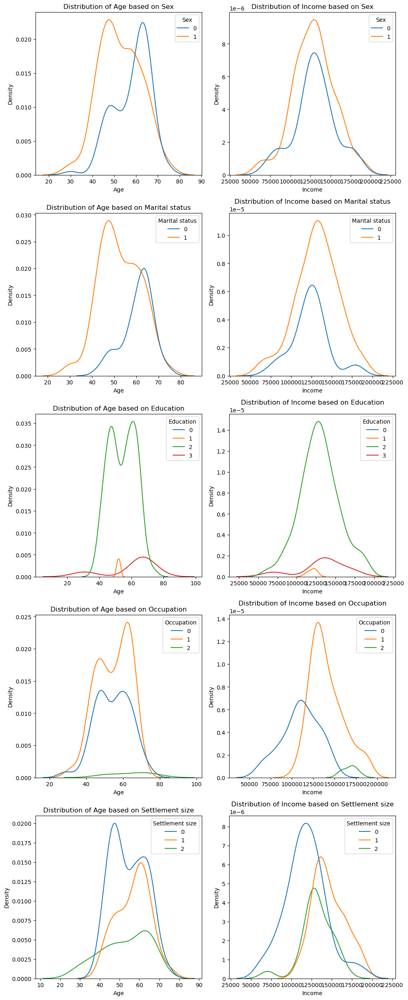

In [51]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,25))
axes = axes.flatten()
ax = 0

for cat in categorical:
    for num in numeric:
        sns.kdeplot(data=df_cluster[df_cluster['Label']==3], x=num, hue=cat, ax=axes[ax])
        axes[ax].set_title(f'Distribution of {num} based on {cat}')
        ax+=1
plt.tight_layout()
plt.show()

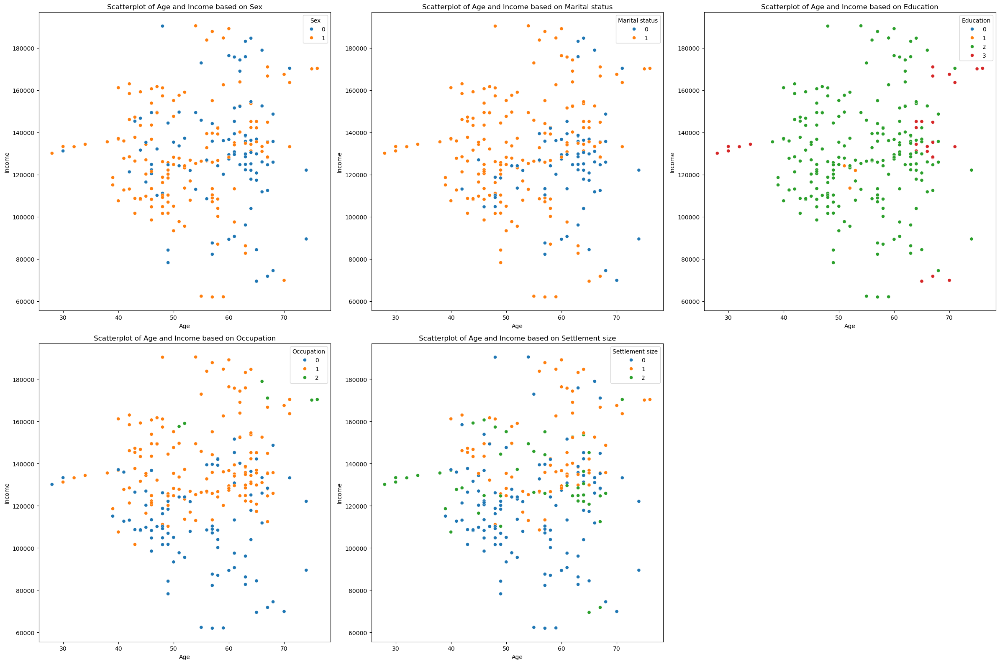

In [52]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,16))
axes = axes.flatten()
ax = 0

for cat in categorical:
    sns.scatterplot(data=df_cluster[df_cluster["Label"]==3], x='Age', y='Income', hue=cat, ax=axes[ax])
    axes[ax].set_title(f'Scatterplot of Age and Income based on {cat}')
    ax+=1
if len(categorical) < len(axes):
    for j in range(len(categorical), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

In Cluster 3, the customer characteristics that can be found are:
* Approximately 60% of these customers are female.
* Over 70% of customers in Cluster 3 are ever married before. Female customers tend to be married  more compared to their male counterparts. There might be also correlation of older customers tend to be single.
* Customers in Cluster 3 tend to be elders, with 5th percentile already over 40 years old; the median and mean are 56 years old and 55 years old respectively. Male customers tend to be older based on the histogram.
* Almost all of the customers in Cluster 3 are high school graduates, with only 1% of them have unknown education level, and over 10% have graduated from university. Those who have bachelor degrees are mostly female customers and ever married before.
* However, regarding income, their annual income might not be as big as Cluster 0, with median of US$ 129,425 and mean of US$ 129,678. Their income can be as low as US$62,002 with the maximum value of US$190,518.
* Regarding occupation, almost 60% of customers in this cluster work as skilled employees or officials, with below 3% work in higher management position. In this cluster the common sense also can be found, with higher position in workplace have bigger annual income based on the histogram.
* Roughly half of them live in small city, with over 30% live in mid-sized city and the rest live in big city. Half of the younger customers in this cluster live in small city.

Actions that can be taken for this cluster include:
* **Promoting products targeting elderly shoppers**, especially health-related products such as vitamins and nutrient supplements. It should be noted that convenience should be taken as a factor too.
* **Creating campaign focusing on healthy lifestyle for older people**, both in digital (can be contents based in older social medias) and physical (making sure ease of access for both location and shopping convenience).
* **Encourage customers to join loyalty program**, with incentives include health products or affordable home products. Offering cheaper deliveries can be an option too, with most customers live in small city.

---
## Cluster 4

In [53]:
cluster_4 = ProfileReport(df_cluster[df_cluster['Label'] == 4])
cluster_4

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [54]:
cluster_4.to_file('cluster_4_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

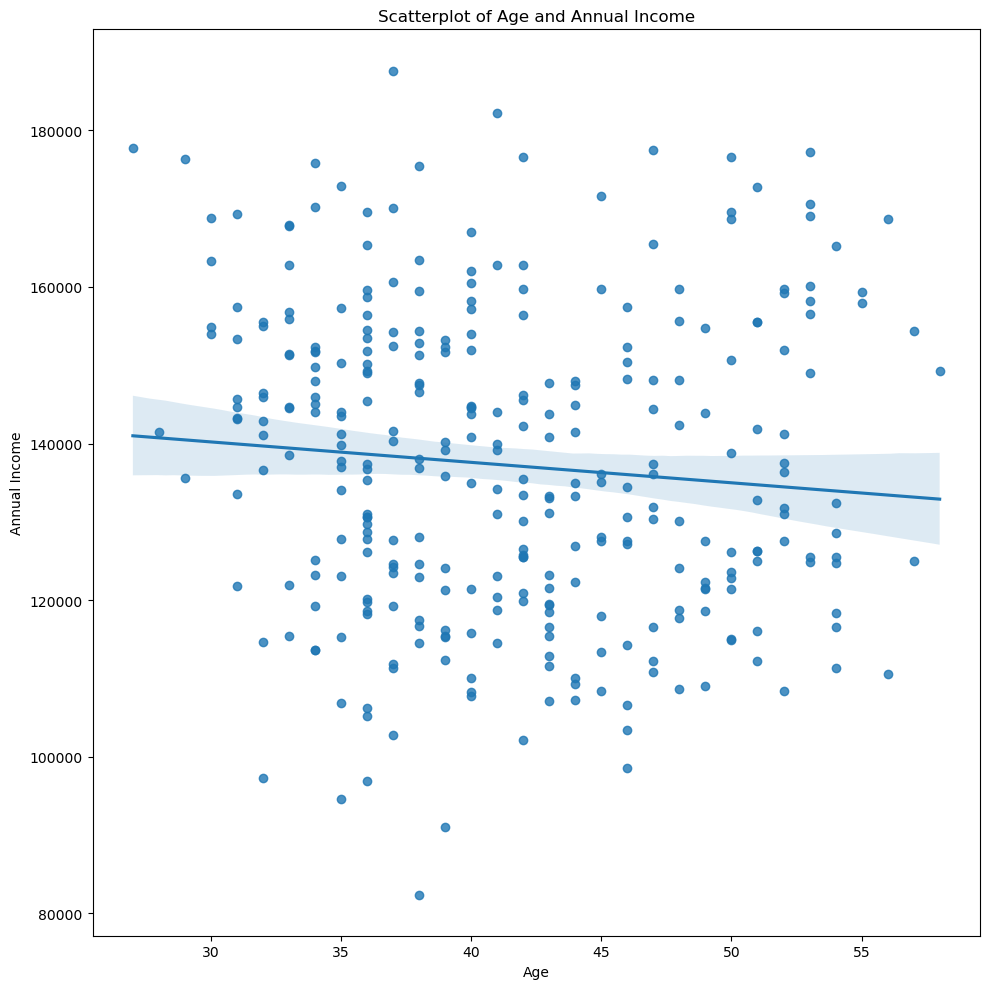

In [55]:
plt.figure(figsize=(10,10))
sns.regplot(data=df_cluster[df_cluster['Label'] == 4], x='Age', y='Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.title('Scatterplot of Age and Annual Income')
plt.tight_layout()
plt.show()

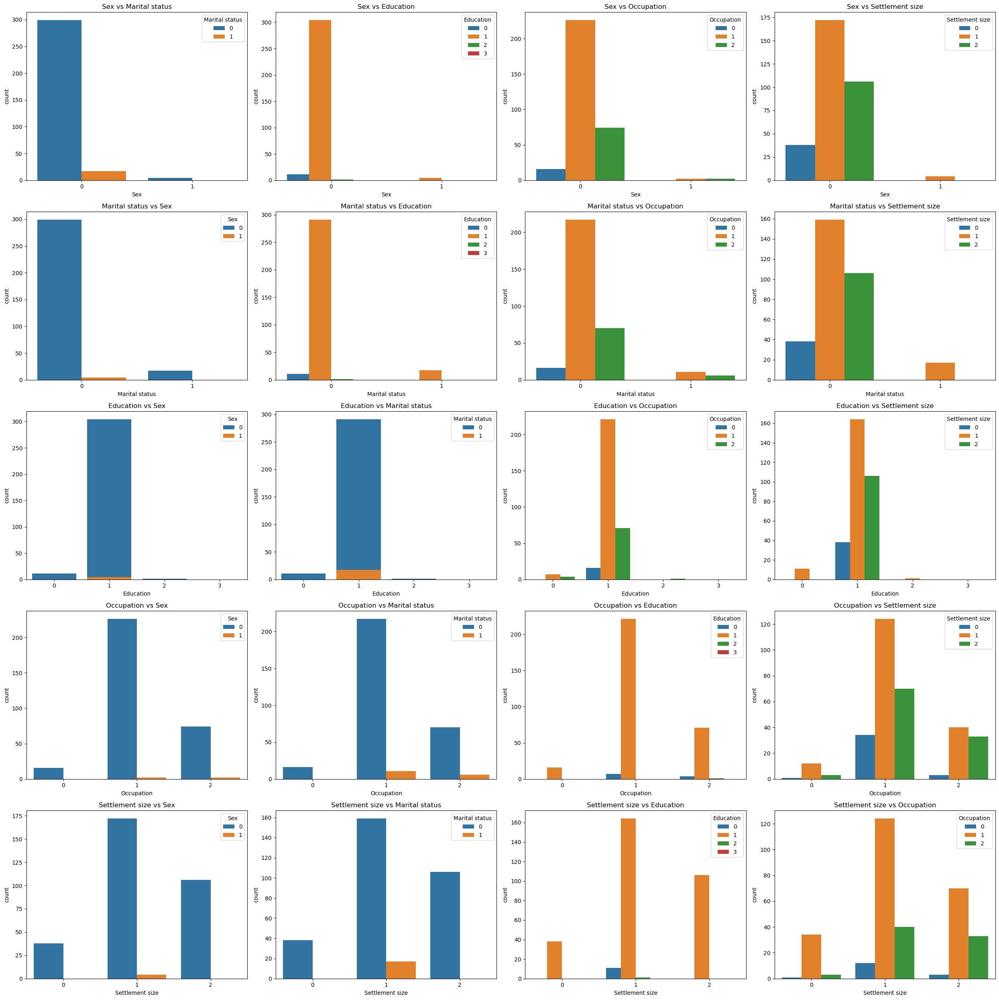

In [56]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(25,25))
axes = axes.flatten()
ax = 0

for cat1 in categorical:
    for cat2 in categorical:
        if cat1!=cat2:
            sns.countplot(data=df_cluster[df_cluster['Label']==4], x=cat1, hue=cat2, ax=axes[ax])
            axes[ax].set_title(f'{cat1} vs {cat2}')
            ax += 1
plt.tight_layout()
plt.show()

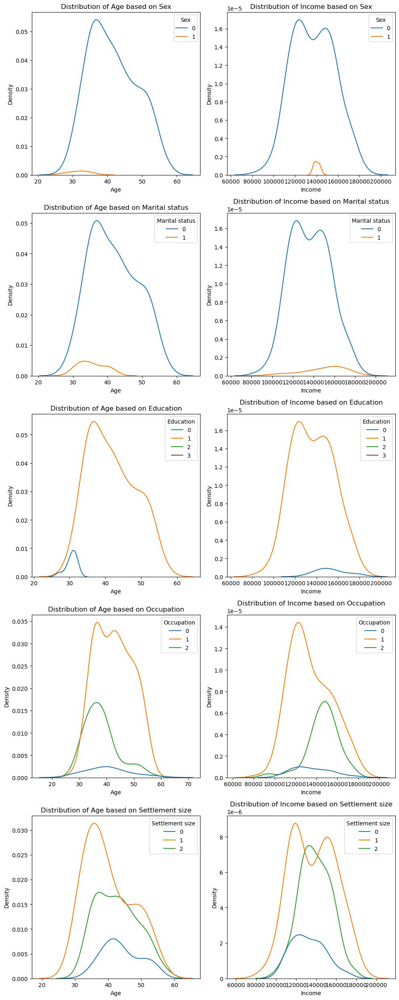

In [57]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,25))
axes = axes.flatten()
ax = 0

for cat in categorical:
    for num in numeric:
        sns.kdeplot(data=df_cluster[df_cluster['Label']==4], x=num, hue=cat, ax=axes[ax])
        axes[ax].set_title(f'Distribution of {num} based on {cat}')
        ax+=1
plt.tight_layout()
plt.show()

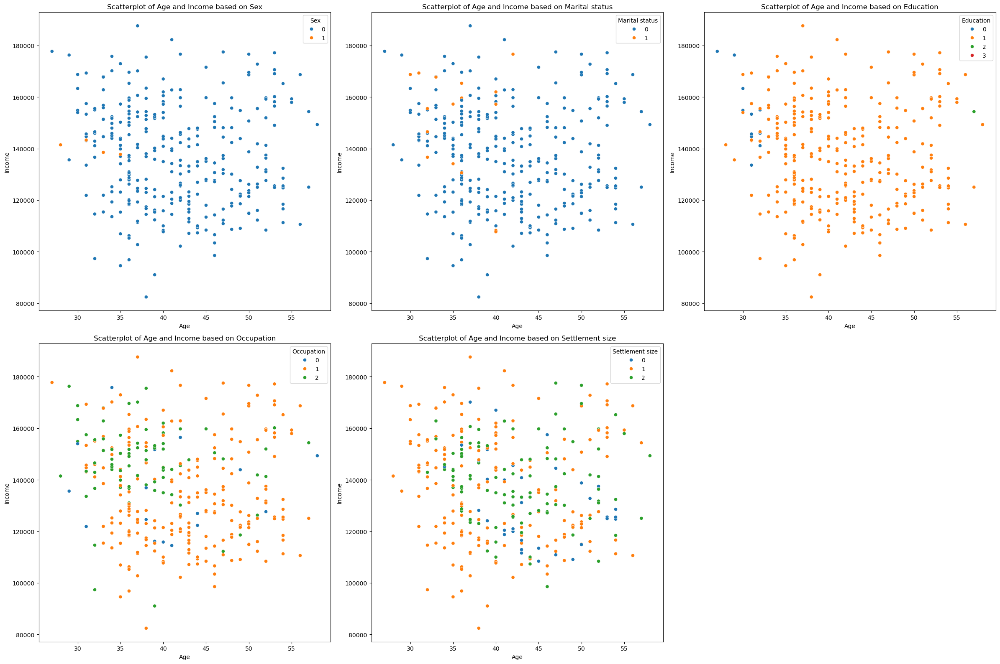

In [58]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,16))
axes = axes.flatten()
ax = 0

for cat in categorical:
    sns.scatterplot(data=df_cluster[df_cluster["Label"]==4], x='Age', y='Income', hue=cat, ax=axes[ax])
    axes[ax].set_title(f'Scatterplot of Age and Income based on {cat}')
    ax+=1
if len(categorical) < len(axes):
    for j in range(len(categorical), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

For customers in Cluster 4, there are several key findings that should be noted:
* Approximately 99% of the customers are male, with only four female customers in the cluster.
* Almost 95% of the customers are single.
* Regarding customers' age in this cluster, the median is 40 years old and the mean is 41 years old. The distribution is right skewed with most customers are in their 30s or 40s, with about 20% are in their 50s.
* Over 96% of customers in Cluster 4 are high school graduates.
* Their income distribution is slightly higher than previous clusters, with median of US$ 136, 780 and mean of US$ 137,225. The 5th-percentile and 95th-percentile of these customers are US$ 108,250 and US$ 169,643 respectively.
* More than 70% work as skilled employees or officials, with almost 25% work in higher managerial position. Customers who work in higher position also tend to have larger annual income.
* Only roughly 12% live in small city, with more than half live in mid-sized city and one-third live in mid-sized city. Customers who live in small city or big city are single.

There are some actionable insights that should be considered for Cluster 4:
* **Offering products and marketing campaigns targeting single males in mid=life**, tailoring product offerings to items such as ready-to-eat meals, practical home essentials, and personal care products.
* **Using bundles for mid-range and slightly premium brands**, since most likely that customers in this cluster earns steadily.
* **Use value-based marketing in making campaigns**, emphasizing straightforward and simple messages for products enhancing their daily routines.
* **Offer promotion that highlight financially responsible purchases** with occasional discounts and cashback.

---
## Cluster 5

In [59]:
cluster_5 = ProfileReport(df_cluster[df_cluster['Label'] == 5])
cluster_5

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [60]:
cluster_5.to_file('cluster_5_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

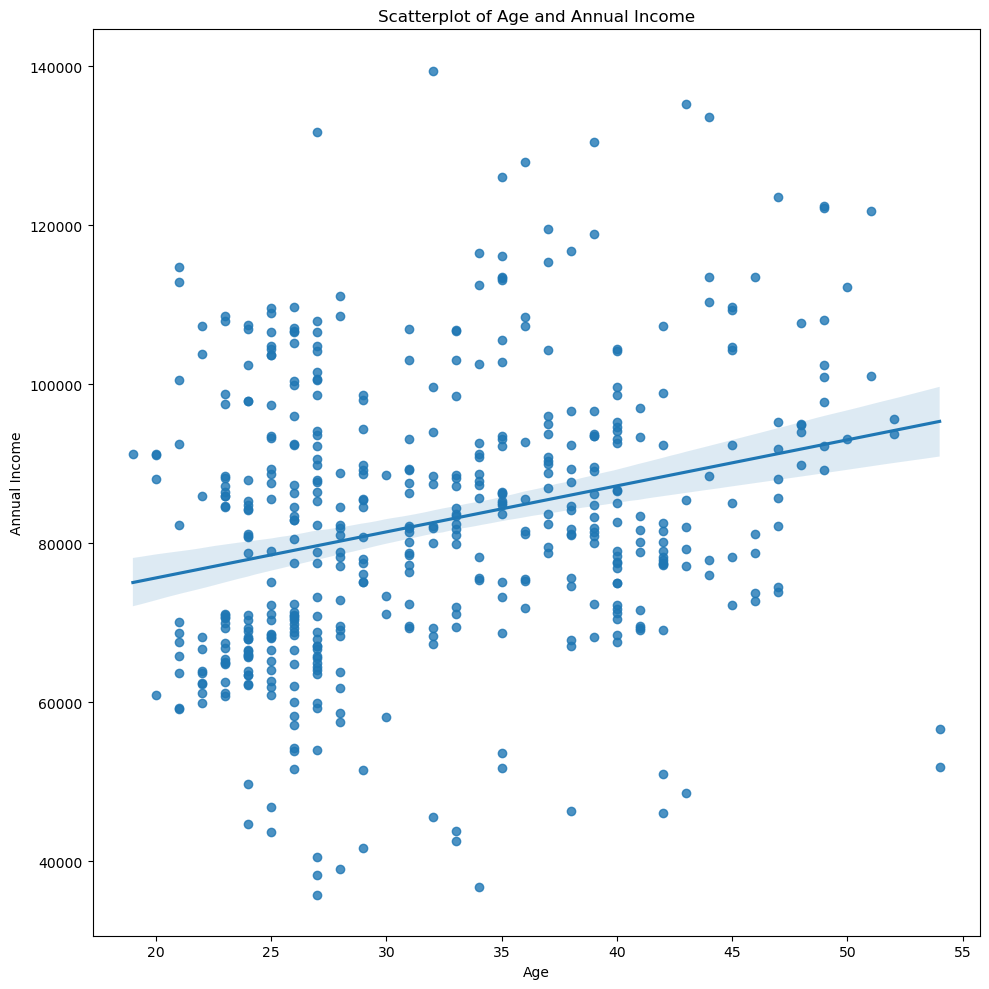

In [61]:
plt.figure(figsize=(10,10))
sns.regplot(data=df_cluster[df_cluster['Label'] == 5], x='Age', y='Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.title('Scatterplot of Age and Annual Income')
plt.tight_layout()
plt.show()

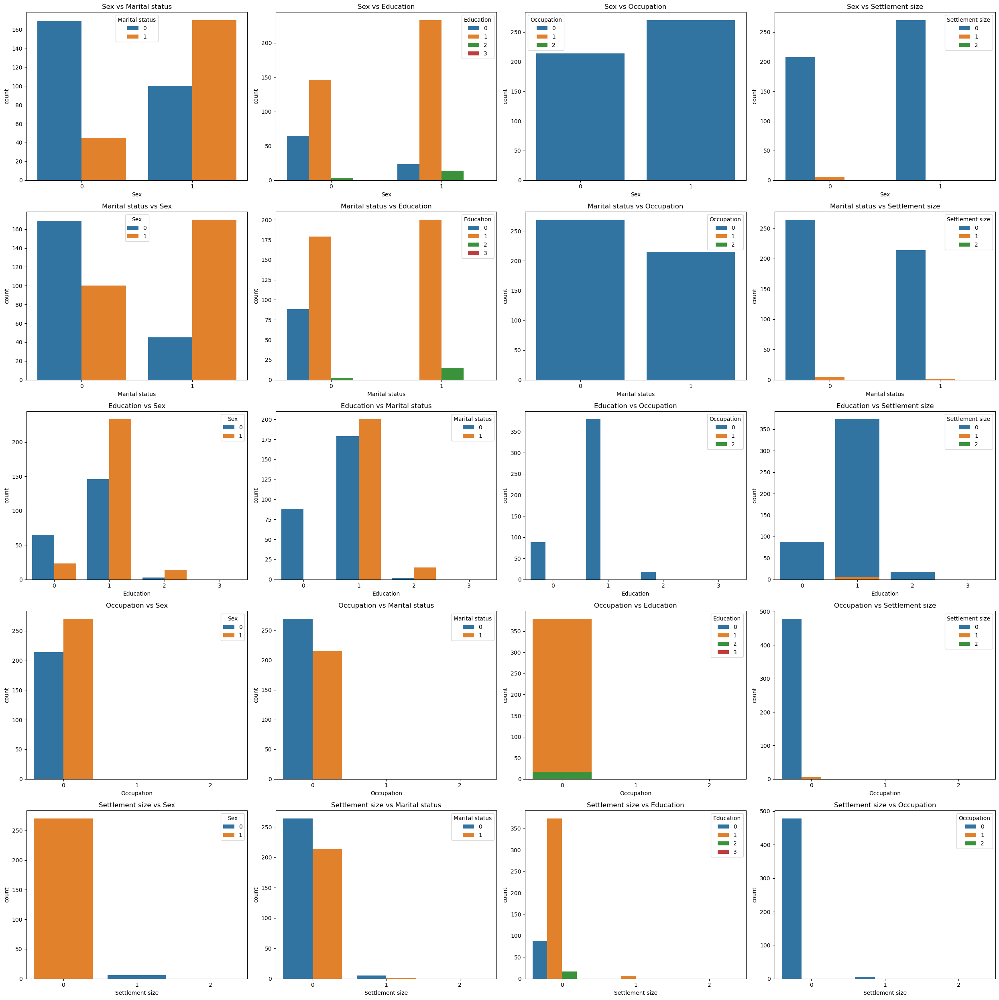

In [62]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(25,25))
axes = axes.flatten()
ax = 0

for cat1 in categorical:
    for cat2 in categorical:
        if cat1!=cat2:
            sns.countplot(data=df_cluster[df_cluster['Label']==5], x=cat1, hue=cat2, ax=axes[ax])
            axes[ax].set_title(f'{cat1} vs {cat2}')
            ax += 1
plt.tight_layout()
plt.show()

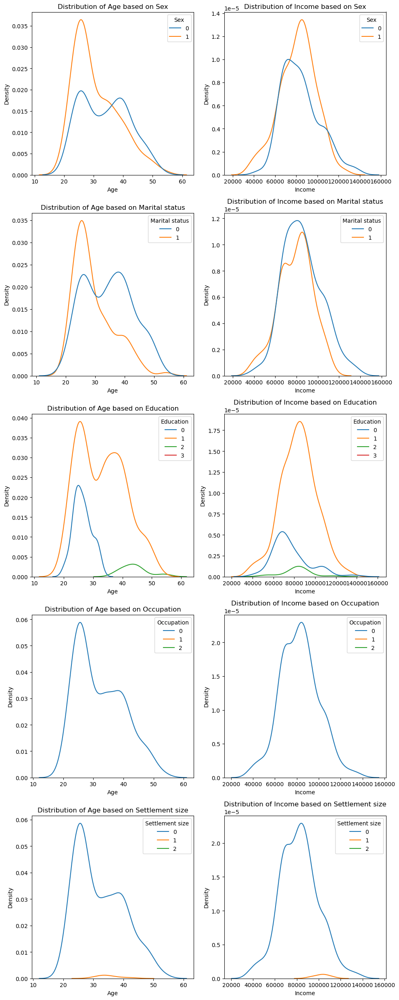

In [63]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,25))
axes = axes.flatten()
ax = 0

for cat in categorical:
    for num in numeric:
        sns.kdeplot(data=df_cluster[df_cluster['Label']==5], x=num, hue=cat, ax=axes[ax])
        axes[ax].set_title(f'Distribution of {num} based on {cat}')
        ax+=1
plt.tight_layout()
plt.show()

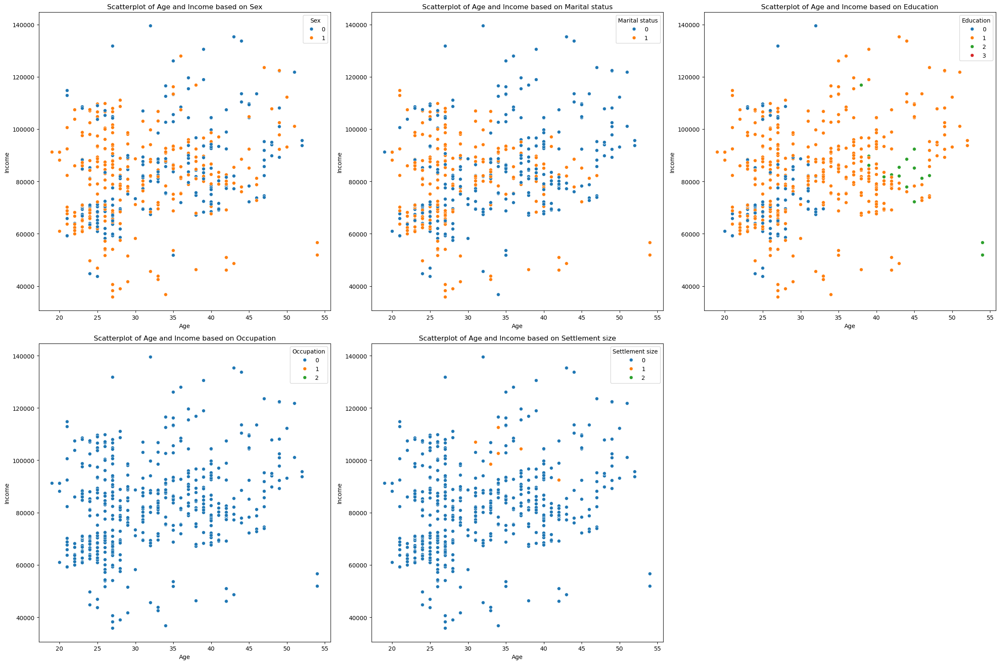

In [64]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,16))
axes = axes.flatten()
ax = 0

for cat in categorical:
    sns.scatterplot(data=df_cluster[df_cluster["Label"]==5], x='Age', y='Income', hue=cat, ax=axes[ax])
    axes[ax].set_title(f'Scatterplot of Age and Income based on {cat}')
    ax+=1
if len(categorical) < len(axes):
    for j in range(len(categorical), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

Several key findings were found in Cluster 5, including:
* Over 55% of customers in this cluster are female, with the rest being male. Female customers tend to be married while male customers tend to be single.
* Over 55% of customers in this cluster are single.
* Customers in Cluster 5 tend to be younger, with age median of 31 years old and mean of 32 years old. They can be as young as 19 years old, and the maximum age is 54 years old. Female (and possibly married) customers tend to be younger than male customers based on the histogram.
* Approximately 80% of customers are high school graduates. In high school education level and university education level, there are more female customers than male customers, while in unknown education level, there are more males.
* Cluster 5 has the lowest income distribution, with median of US$ 82,239 and mean of US$ 82,702. 
* They are all unemployed or working as unskilled workers and live in small city.

These are actionable insights and recommendations for customers in Cluster 5:
* **Prioritize promoting affordable and budget-friendly products** using warehouse brands and emphasizing value-for-money.
* **Push family and household essentials** with trendy, low-cost items and brands.
* **Promote easy-cooking and ready-to-eat products** that are chaper than self-cooking.

---
---
# Conclusion

This analysis segmented supermarket customers into six clusters to uncover actionable insights for personalized marketing strategies and improved customer engagement. Key insights included the following:

* Cluster 0: High-income, managerial males in their 30s-40s; targeting focused on premium products, urban promotions, and loyalty programs for professionals.
* Cluster 1: Younger, single males in urban areas with lower incomes; insights suggested affordable products, convenience-focused promotions, and loyalty initiatives.
* Cluster 2: Predominantly married, young female customers from small cities with modest incomes; promotional focus on family essentials and community-centric campaigns.
* Cluster 3: Older, educated customers with moderate incomes; suggested focus on health-oriented products and elder-friendly loyalty programs.
* Cluster 4: Middle-aged, single males in managerial roles; targeted with convenience items, city-specific campaigns, and male-centric product promotions.
* Cluster 5: Younger, lower-income customers in unskilled jobs from small cities; emphasis on budget-friendly essentials and community-focused loyalty programs.
<br><br>
By addressing each cluster's unique profile, the supermarket can deliver targeted marketing, improve customer satisfaction, and drive growth.